In [42]:
#funkcje z instrukcji 
"""Function definitions that are used in LSB steganography."""
from matplotlib import pyplot as plt
import numpy as np
import binascii
import cv2 as cv
import math
import lorem
plt.rcParams["figure.figsize"] = (18,10)



def encode_as_binary_array(msg):
    """Encode a message as a binary string."""
    msg = msg.encode("utf-8")
    msg = msg.hex()
    msg = [msg[i:i + 2] for i in range(0, len(msg), 2)]
    msg = [ "{:08b}".format(int(el, base=16)) for el in msg]
    return "".join(msg)


def decode_from_binary_array(array):
    """Decode a binary string to utf8."""
    array = [array[i:i+8] for i in range(0, len(array), 8)]
    if len(array[-1]) != 8:
        array[-1] = array[-1] + "0" * (8 - len(array[-1]))
    array = [ "{:02x}".format(int(el, 2)) for el in array]
    array = "".join(array)
    result = binascii.unhexlify(array)
    return result.decode("utf-8", errors="replace")


def load_image(path, pad=False):
    """Load an image.
    
    If pad is set then pad an image to multiple of 8 pixels.
    """
    image = cv.imread(path)
    image = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    if pad:
        y_pad = 8 - (image.shape[0] % 8)
        x_pad = 8 - (image.shape[1] % 8)
        image = np.pad(
            image, ((0, y_pad), (0, x_pad) ,(0, 0)), mode='constant')
    return image


def save_image(path, image):
    """Save an image."""
    plt.imsave(path, image) 


def clamp(n, minn, maxn):
    """Clamp the n value to be in range (minn, maxn)."""
    return max(min(maxn, n), minn)


def hide_message(image, message, nbits=1):
    """Hide a message in an image (LSB).
    
    nbits: number of least significant bits
    """
    nbits = clamp(nbits, 1, 8)
    shape = image.shape
    image = np.copy(image).flatten()
    #print(len(image))
    if len(message) > len(image) * nbits:
        raise ValueError("Message is to long :(")
    
    chunks = [message[i:i + nbits] for i in range(0, len(message), nbits)]
    for i, chunk in enumerate(chunks):
        byte = "{:08b}".format(image[i])
        new_byte = byte[:-nbits] + chunk
        image[i] = int(new_byte, 2)
        
    return image.reshape(shape)


def reveal_message(image, nbits=1, length=0):
    """Reveal the hidden message.
    
    nbits: number of least significant bits
    length: length of the message in bits.
    """
    nbits = clamp(nbits, 1, 8)
    shape = image.shape
    image = np.copy(image).flatten()
    length_in_pixels = math.ceil(length/nbits)
    if len(image) < length_in_pixels or length_in_pixels <= 0:
        length_in_pixels = len(image)
    
    message = ""
    i = 0
    while i < length_in_pixels:
        byte = "{:08b}".format(image[i])
        message += byte[-nbits:]
        i += 1
        
    mod = length % -nbits
    if mod != 0:
        message = message[:mod]
    return message

# Zadanie 1

Nikt nic nie wie


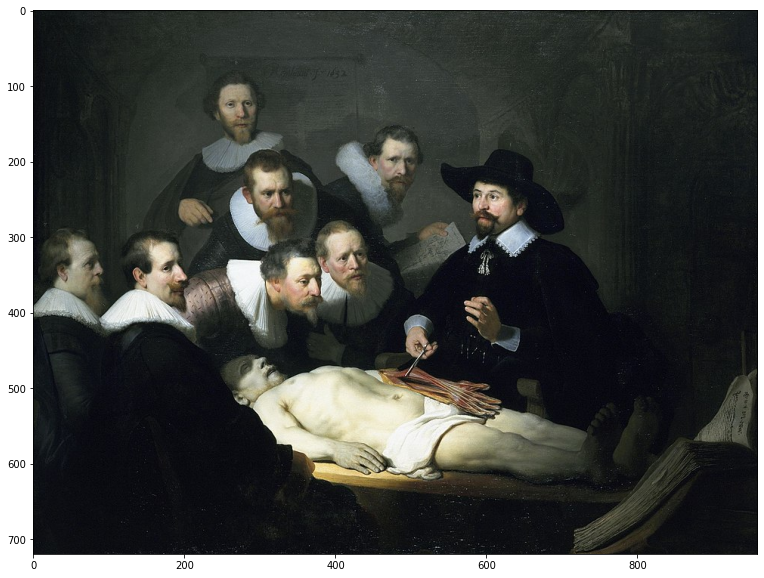

In [43]:
original_image = load_image("images/rembrandt.png")  # Wczytanie obrazka

message = "Nikt nic nie wie" 
n = 1  # liczba najmłodszych bitów używanych do ukrycia wiadomości

message = encode_as_binary_array(message)  # Zakodowanie wiadomości jako ciąg 0 i 1
image_with_message = hide_message(original_image, message, n)  # Ukrycie wiadomości w obrazku

save_image("images/image_with_message.png", image_with_message)  # Zapisanie obrazka w formacie PNG


image_with_message_png = load_image("images/image_with_message.png")  # Wczytanie obrazka PNG


secret_message_png = decode_from_binary_array(
    reveal_message(image_with_message_png, nbits=n, length=len(message)))  # Odczytanie ukrytej wiadomości z PNG

print(secret_message_png)

plt.imshow(image_with_message_png)

# Zadanie 2

[0.3330649210211254, 0.7537403931564516, 2.2924564554126596, 6.326209303672807, 9.93259375120689, 10.27540648051597, 9.915000193102383, 9.132136581315413]


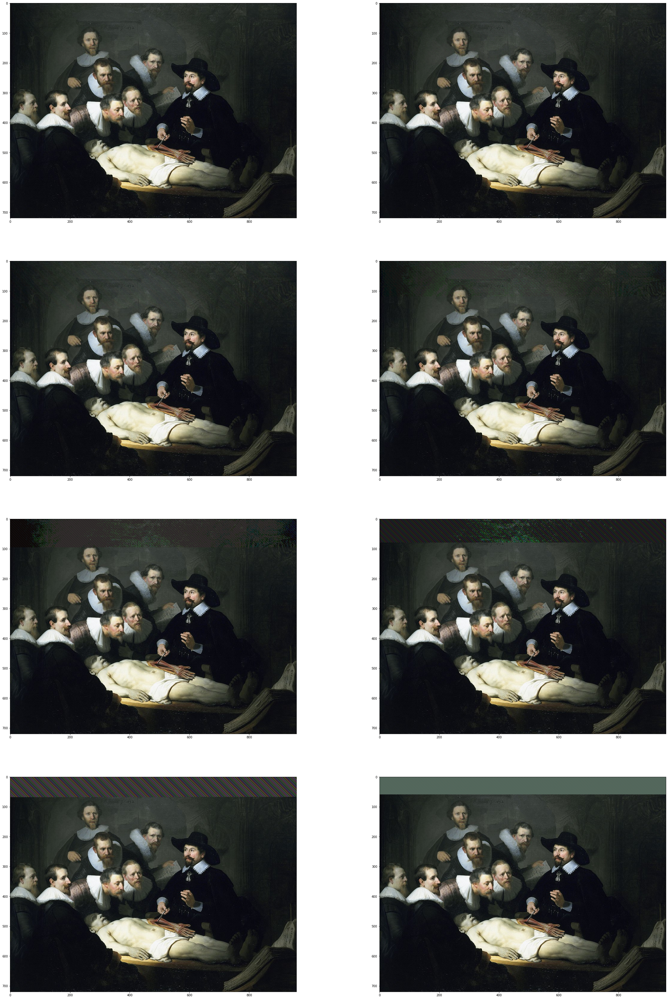

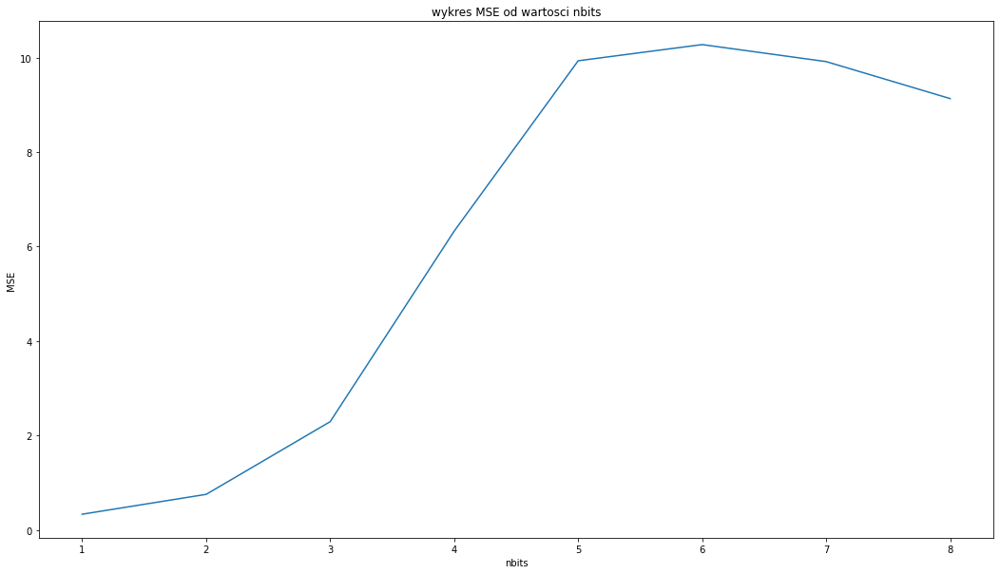

In [48]:
inquisition_org = load_image("images/rembrandt.png") 
message ="Jas jadl fasole"*int(0.75*inquisition_org.shape[0]*inquisition_org.shape[1]/45)

message_bin = encode_as_binary_array(message)
#message_bin = message_bin*int(len(inquisition_org)*0.75/len(message_bin))
bins = 8
# dodanie wiadomosci do kazdego z obrazkow zwiekszajac blad
message_hidden_images = [ hide_message(inquisition_org, message_bin, nbits=i) for i in range(1,bins+1) ]

fig = plt.figure(figsize=(40, 60))
for i in range(bins):
    fig.add_subplot(4, 2, i+1)
    plt.imshow(message_hidden_images[i])
# wyliczanie bledow MSE dla obrazka
errors = [ ((inquisition_org - message_hidden_images[i]  )**2 ).mean(axis=None)  for i in range(bins)  ]
x_axis = [i for i in range(1, bins+1)]


figurete, ax = plt.subplots(1,1)
ax.plot(x_axis, errors)
ax.title.set_text('wykres MSE od wartosci nbits')
ax.set_xlabel('nbits')
ax.set_ylabel('MSE')
print(errors)


    
    

# Zadanie 3

Nikt nic nie wie


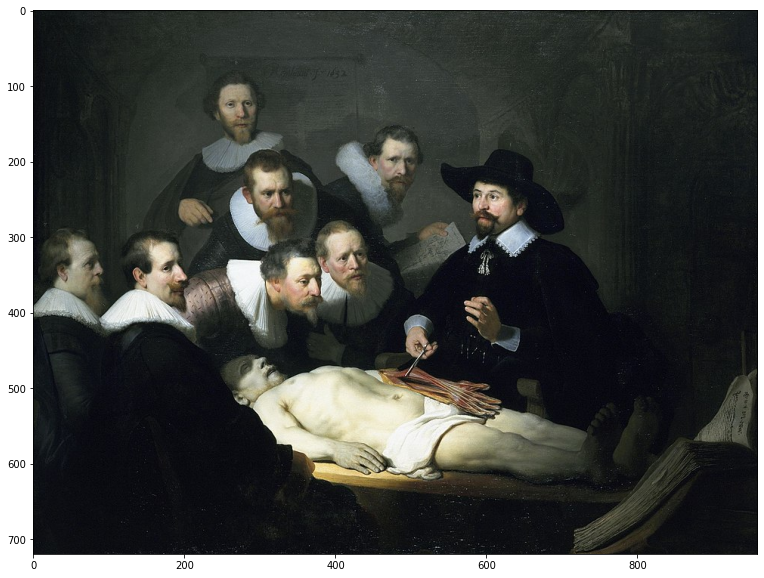

In [49]:
def hide_message(image, message, nbits=1, spos=0):
    """Hide a message in an image (LSB).
    
    nbits: number of least significant bits
    """
 
        
    nbits = clamp(nbits, 1, 8)
    shape = image.shape
    image = np.copy(image).flatten()
    # do pos niech bedzie bez zmian
    image_start = image[:spos] 
    # dodajemy napis po pos
    image = image[spos:]
    
    if len(message) > len(image) * nbits + spos:
        raise ValueError("Message is to long :(")
    
    chunks = [message[i:i + nbits] for i in range(0, len(message), nbits)]
    for i, chunk in enumerate(chunks):
        byte = "{:08b}".format(image[i])
        new_byte = byte[:-nbits] + chunk
        image[i] = int(new_byte, 2)
    #laczenie poczatku z zmienionym fragmentem
    image = np.concatenate((image_start, image ), axis=None)
    return image.reshape(shape)



def reveal_message(image, nbits=1, length=0, spos=0):
    """Reveal the hidden message.
    
    nbits: number of least significant bits
    length: length of the message in bits.
    """
    
    nbits = clamp(nbits, 1, 8)
    shape = image.shape
    image = np.copy(image).flatten()[spos:]
    #length_in_pixels = math.ceil(length-spos*8/nbits)
    length_in_pixels = math.ceil(length/nbits)
    if len(image) < length_in_pixels or length_in_pixels <= 0:
        length_in_pixels = len(image)
    
    message = ""
    i = 0
    while i < length_in_pixels:
        byte = "{:08b}".format(image[i])
        message += byte[-nbits:]
        i += 1
        
    mod = length % -nbits
    if mod != 0:
        message = message[:mod]
    return message


# lets see if it runs 
original_image = load_image("images/spanish.png")  # Wczytanie obrazka
# Mnożenie stringów działa jak zwielokratnianie
message = "Nikt nic nie wie" * 1
n = 1  # liczba najmłodszych bitów używanych do ukrycia wiadomości
position = 2
message = encode_as_binary_array(message)  # Zakodowanie wiadomości jako ciąg 0 i 1
image_with_message = hide_message(original_image, message, nbits=n, spos=position)  # Ukrycie wiadomości w obrazku

secret_message_png = decode_from_binary_array(
    reveal_message(image_with_message, nbits=n, length=len(message),spos=position))  # Odczytanie ukrytej wiadomości z PNG

print(secret_message_png)

plt.imshow(image_with_message_png)

# Zadanie 4

Premature end of JPEG file


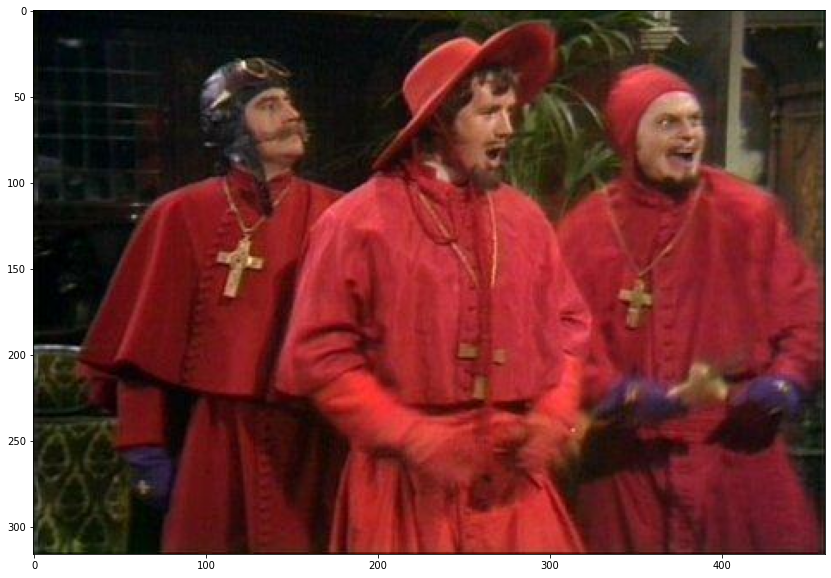

In [52]:
def hide_image(image, secret_image_path, nbits=1):
    with open(secret_image_path, "rb") as file:
        secret_img = file.read()
        
    secret_img = secret_img.hex()
    secret_img = [secret_img[i:i + 2] for i in range(0, len(secret_img), 2)]
    secret_img = ["{:08b}".format(int(el, base=16)) for el in secret_img]
    secret_img = "".join(secret_img)
    return hide_message(image, secret_img, nbits), len(secret_img)


def reveal_image(image, lenght, nbits=1):
    # pobranie obrazu w postaci napizu z obrazu
    message = reveal_message(image, length=lenght, nbits=nbits)
    # przedstawienie danych w postaci tablicy bajtow w postaci bitow
    message = [message[i:i + 8] for i in range(0, len(message), 8)]
    #konwersja na liczbe 
    message = [int(element, 2) for element in message]
    #Stworzenie bajtow z liczb
    message = bytes(message)

    with open("zad4.jpg", "wb") as file:
        file.write(message)
    return load_image("zad4.jpg")
original_image = load_image("images/rembrandt.png")
image_secret, lenght_secret = hide_image(original_image, 'images/spanish.jpg', 5)
image = reveal_image(image_secret, lenght_secret, 5)
plt.imshow(image)

# Zadanie 5

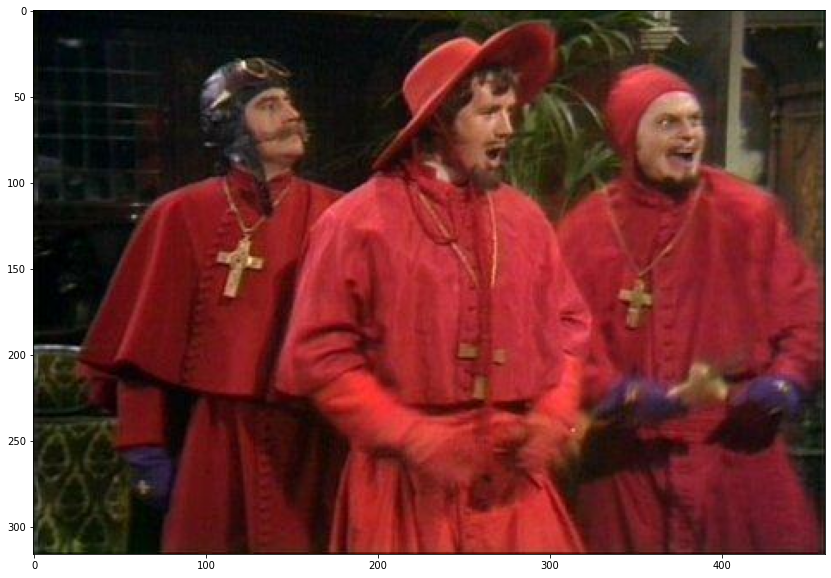

In [ ]:
def reveal_message(image, nbits=1, ):
    """Reveal the hidden message.
    
    nbits: number of least significant bits
    length: length of the message in bits.
    """
    
    nbits = clamp(nbits, 1, 8)
    shape = image.shape
    image = np.copy(image).flatten()
    
    # kodowanie eoi
    jpg_eoi = bin(255)[2:].zfill(8)+bin(217)[2:].zfill(0)
    print(jpg_eoi)
    message = ""
    i = 0
    while True:
        byte = "{:08b}".format(image[i])
        message += byte[-nbits:]
        # rozpatrujemy czy znalezlismy stopke jpg'a jak tak to konczymy
        if message.endswith(jpg_eoi):
            break
        i += 1
        
        
    mod = i % -nbits
    if mod != 0:
        message = message[:mod]
    return message

def reveal_image(image, nbits=1):
    # pobranie obrazu w postaci napizu z obrazu
    message = reveal_message(image,  nbits=nbits)
    # przedstawienie danych w postaci tablicy bajtow w postaci bitow
    message = [message[i:i + 8] for i in range(0, len(message), 8)]
    #konwersja na liczbe 
    message = [int(element, 2) for element in message]
    #Stworzenie bajtow z liczb
    message = bytes(message)

    with open("zad5.jpg", "wb") as file:
        file.write(message)
    return load_image("zad5.jpg")


original_image = load_image("images/rembrandt.png")
image_secret, lenght_secret = hide_image(original_image, 'images/spanish.jpg', 1)
image = reveal_image(image_secret,  1)
plt.imshow(image)